In [1]:
# GT Project
# For visulization
# Claire Hu
#
# 1. Prepare Problem #

#    a. Load libraries #
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

#    b. Load dataset #
input_file = 'RawData_NEGONE.csv'
dataset = pd.read_csv(input_file)
print(dataset)

       Restatement_Classifier      CIK  CFOChange  PriorRestatements  \
0                           0  1365357          0                  1   
1                           0  1125264          0                  1   
2                           0  1069152          0                  1   
3                           0   846475          0                  1   
4                           0  1318008          0                  0   
...                       ...      ...        ...                ...   
34536                       0    26172          1                  0   
34537                       0    18230          0                  0   
34538                       0   941548          0                  0   
34539                       0   874761          0                  1   
34540                       0     1800          0                  0   

       PriorRevisions  PYEffectiveControls ticker  Periodend  Auditor_Key  \
0                   1                    1   ZZLL       20

In [2]:
# 2. Summarize Data #

#    a. Descriptive statistics #
# Summary
dataset.describe() #equivalent to summary in R

,Restatement_Classifier,CIK,CFOChange,PriorRestatements,PriorRevisions,PYEffectiveControls,Periodend,Auditor_Key,AuditorBigFour,AuditorNextFour,...,SoftAssets_YOY,DSO_YOY,Market_Cap_YOY,RevenueToPrefStock,SGAExpense_to_LTInvest,Assets_to_LTInvest,Revenue_to_LTInvest,Assets_to_STInvest,FirstTenK,WCAccruals
count,34541.000000,3.454100e+04,34541.000000,34541.000000,34541.000000,34541.000000,34541.000000,34541.000000,34541.000000,34541.000000,...,34541.000000,34541.000000,34541.000000,3.454100e+04,3.454100e+04,3.454100e+04,3.454100e+04,3.454100e+04,34541.000000,34541.000000
mean,0.034307,9.963069e+05,0.125850,0.228916,0.343707,0.822443,2013.432790,3070.038679,0.521844,0.105382,...,0.085916,0.027780,-0.138904,2.580118e+09,7.588621e+05,7.400146e+06,2.050354e+06,8.559767e+09,1968.746186,-5.372452
std,0.182019,4.458449e+05,0.331686,0.420141,0.474952,0.382145,1.764519,6191.161563,0.499530,0.307049,...,0.429660,0.386683,0.597358,1.344270e+10,1.525424e+07,2.780319e+08,4.716745e+07,4.663196e+11,268.520699,436.648344
min,0.000000,1.750000e+03,0.000000,0.000000,0.000000,0.000000,2008.000000,1.000000,0.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.896010e+09,-2.505515e+07,-2.740606e+07,-1.896010e+09,-2.127182e+06,-1.000000,-42224.000000
25%,0.000000,8.202370e+05,0.000000,0.000000,0.000000,1.000000,2012.000000,2.000000,0.000000,0.000000,...,-0.080960,-0.076501,-0.672893,1.574257e+05,1.417623e-01,3.669970e+00,1.275571e-01,3.719722e+00,2001.000000,-0.066814
50%,0.000000,1.066764e+06,0.000000,0.000000,0.000000,1.000000,2013.000000,4.000000,1.000000,0.000000,...,0.023056,0.000000,-0.007892,7.432673e+07,2.723719e+00,1.888350e+01,6.787634e+00,1.173536e+01,2004.000000,-0.004228
75%,0.000000,1.366340e+06,0.000000,0.000000,1.000000,1.000000,2015.000000,2194.000000,1.000000,0.000000,...,0.196433,0.080810,0.219608,9.462426e+08,2.483515e+01,9.101869e+01,4.545093e+01,4.232019e+01,2009.000000,0.032645
max,1.000000,1.660719e+06,1.000000,1.000000,1.000000,1.000000,2016.000000,29648.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,4.816130e+11,1.186890e+09,3.346040e+10,3.243228e+09,3.579820e+13,2017.000000,24312.533330


In [3]:
# VarType (Pandas version to check)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34541 entries, 0 to 34540
Columns: 209 entries, Restatement_Classifier to WCAccruals
dtypes: float64(113), int64(95), object(1)
memory usage: 55.1+ MB


In [4]:
# VarType (another Pandas version to check)
print(dataset.dtypes)

Restatement_Classifier      int64
CIK                         int64
CFOChange                   int64
PriorRestatements           int64
PriorRevisions              int64
                           ...   
Assets_to_LTInvest        float64
Revenue_to_LTInvest       float64
Assets_to_STInvest        float64
FirstTenK                   int64
WCAccruals                float64
Length: 209, dtype: object


In [5]:
# check if any field include NA value ~
dataset.isnull().values.any()

False

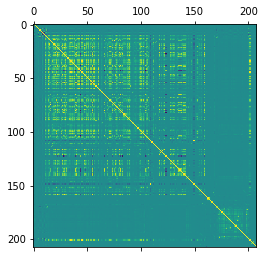

In [6]:
# Corr Matrix

#Simple version of the corr matrix
plt.matshow(dataset.corr())
plt.show()

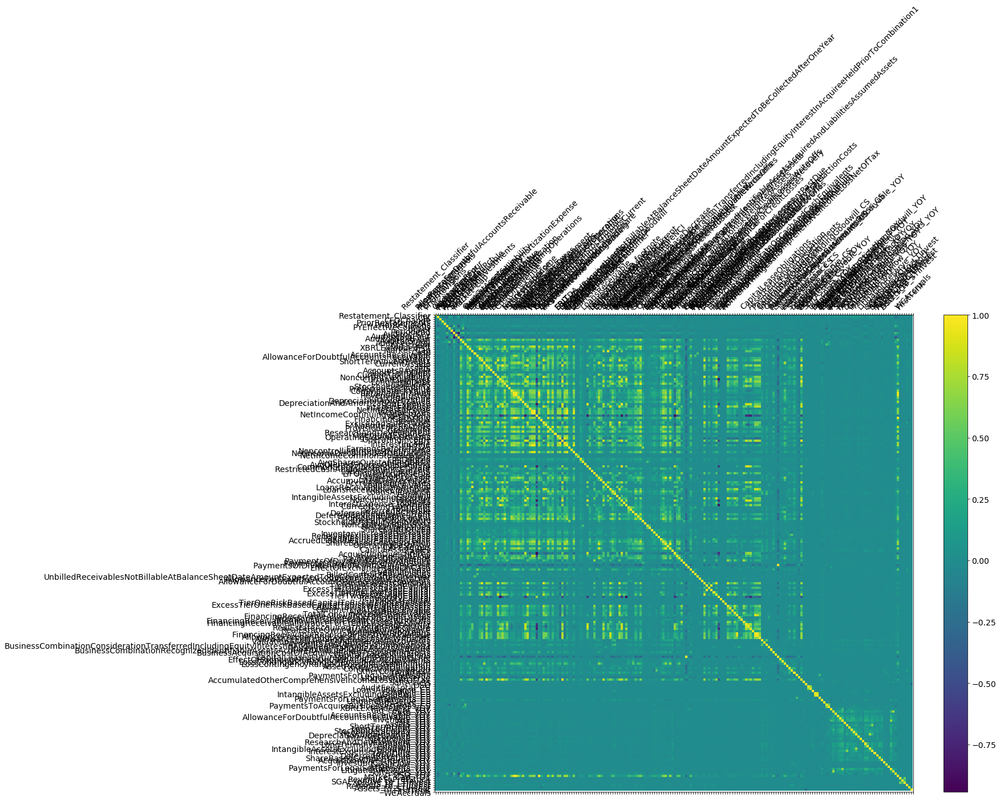

In [7]:
# Another version of the advanced version of corr matrix visulization.

f = plt.figure(figsize=(19, 15))
plt.matshow(dataset.corr(), fignum=f.number)
plt.xticks(range(dataset.shape[1]), dataset.columns, fontsize=14, rotation=45)
plt.yticks(range(dataset.shape[1]), dataset.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

In [8]:
# Another fancy version of the visulization to present same information of corr matrix by using built in pandas tools.

corr = dataset.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

In [9]:
#Count of class labels
dataset.groupby('Restatement_Classifier').size()

Restatement_Classifier
0    33356
1     1185
dtype: int64

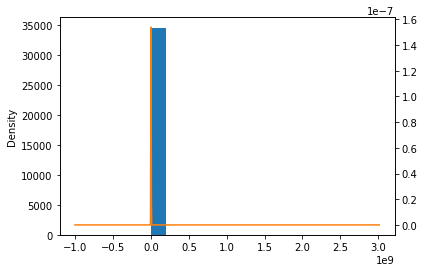

In [10]:
#    b. Visulization 
# visulize the target dependency "UnbilledReceivablesNotBillableAtBalanceSheetDateAmountExpectedToBeCollectedAfterOneYear" in histogram & density by using pandas library
ax = dataset.UnbilledReceivablesNotBillableAtBalanceSheetDateAmountExpectedToBeCollectedAfterOneYear.plot(kind='hist')
dataset.UnbilledReceivablesNotBillableAtBalanceSheetDateAmountExpectedToBeCollectedAfterOneYear.plot(kind='kde', ax=ax, secondary_y=True)

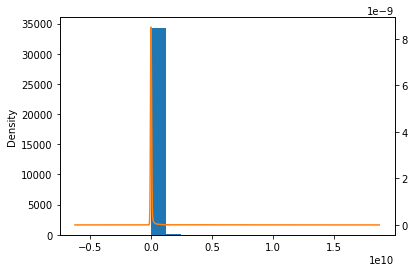

In [11]:
#    b. Visulization 
# visulize the target dependency "PaymentsOfDividendsCommonStock" in histogram & density by using pandas library
ax = dataset.PaymentsOfDividendsCommonStock.plot(kind='hist')
dataset.PaymentsOfDividendsCommonStock.plot(kind='kde', ax=ax, secondary_y=True)

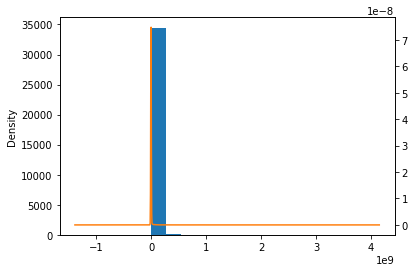

In [12]:
#    b. Visulization 
# visulize the target dependency "PaymentsOfDividendsNoncontrollingInterest" in histogram & density by using pandas library
ax = dataset.PaymentsOfDividendsNoncontrollingInterest.plot(kind='hist')
dataset.PaymentsOfDividendsNoncontrollingInterest.plot(kind='kde', ax=ax, secondary_y=True)

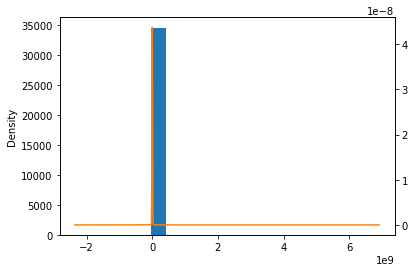

In [13]:
#    b. Visulization 
# visulize the target dependency "ServicingFeesNet" in histogram & density by using pandas library
ax = dataset.ServicingFeesNet.plot(kind='hist')
dataset.ServicingFeesNet.plot(kind='kde', ax=ax, secondary_y=True)

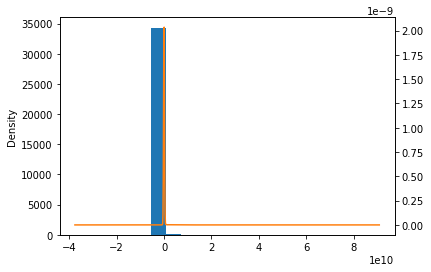

In [14]:
#    b. Visulization 
# visulize the target dependency "NonInterestIncome" in histogram & density by using pandas library
ax = dataset.NonInterestIncome.plot(kind='hist')
dataset.NonInterestIncome.plot(kind='kde', ax=ax, secondary_y=True)

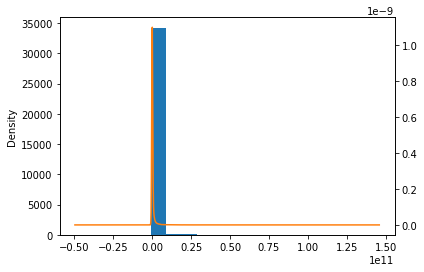

In [15]:
#    b. Visulization 
# visulize the target dependency "SGAExpense" in histogram & density by using pandas library
ax = dataset.SGAExpense.plot(kind='hist')
dataset.SGAExpense.plot(kind='kde', ax=ax, secondary_y=True)

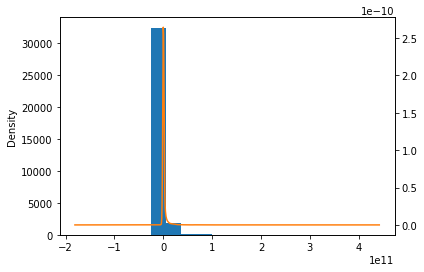

In [16]:
#    b. Visulization 
# visulize the target dependency "StockholdersEquity" in histogram & density by using pandas library
ax = dataset.StockholdersEquity.plot(kind='hist')
dataset.StockholdersEquity.plot(kind='kde', ax=ax, secondary_y=True)

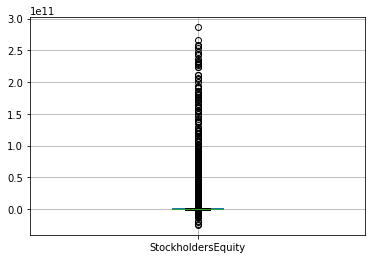

In [17]:
# Density
boxplot = dataset.boxplot(column=['StockholdersEquity'])

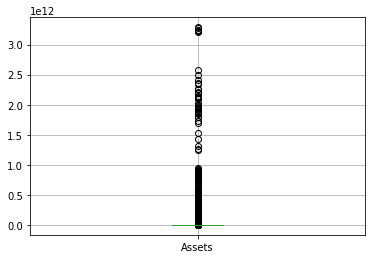

In [18]:
# Density
boxplot = dataset.boxplot(column=['Assets'])

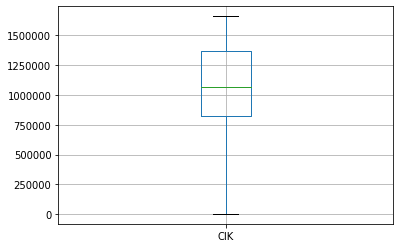

In [19]:
# Density
boxplot = dataset.boxplot(column=['CIK'])

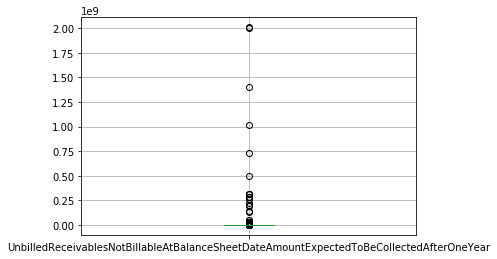

In [20]:
# Density
boxplot = dataset.boxplot(column=['UnbilledReceivablesNotBillableAtBalanceSheetDateAmountExpectedToBeCollectedAfterOneYear'])

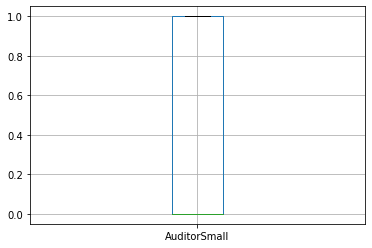

In [21]:
# Density
boxplot = dataset.boxplot(column=['AuditorSmall'])

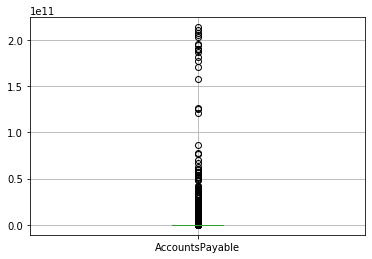

In [22]:
# Density
boxplot = dataset.boxplot(column=['AccountsPayable'])

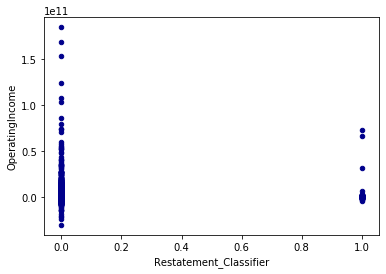

In [23]:
# Some example of feature scatter by using pandas
ax = dataset.plot.scatter(x='Restatement_Classifier', y='OperatingIncome', c='DarkBlue')

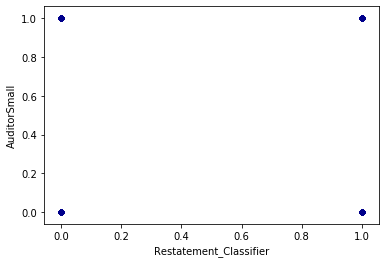

In [24]:
# Some example of feature scatter by using pandas
ax = dataset.plot.scatter(x='Restatement_Classifier', y='AuditorSmall', c='DarkBlue')

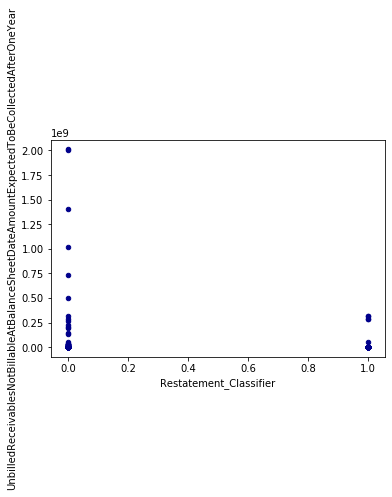

In [25]:
# Some example of feature scatter by using pandas
ax = dataset.plot.scatter(x='Restatement_Classifier', y='UnbilledReceivablesNotBillableAtBalanceSheetDateAmountExpectedToBeCollectedAfterOneYear', c='DarkBlue')

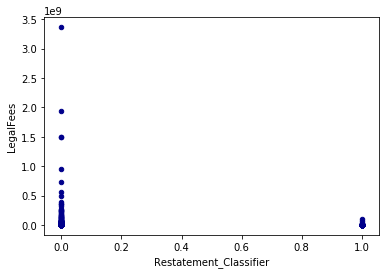

In [26]:
# Some example of feature scatter by using pandas
ax = dataset.plot.scatter(x='Restatement_Classifier', y='LegalFees', c='DarkBlue')

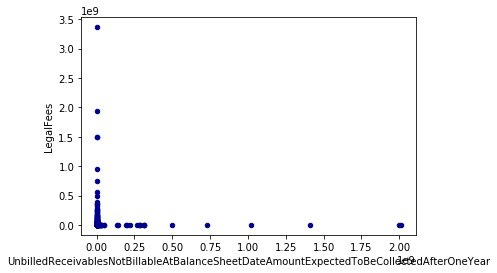

In [27]:
# Some example of feature scatter by using pandas
ax = dataset.plot.scatter(x='UnbilledReceivablesNotBillableAtBalanceSheetDateAmountExpectedToBeCollectedAfterOneYear', y='LegalFees', c='DarkBlue')

In [28]:
# 3. Prepare Data
#    a. Data Cleaning 
#       Because we have checked the NA value, 
#       and transferd the string value & category value into integer, so we are already done the cleaning part

#    b. Feature Selection
#       Unlike the complex problem which have hundreds of the feature, here we only have around 17 features, 
#       so we choose all of them and did not do feature selection.


#    c. Testing the assumption
#       N/A

#    d. Data Transforms 
#       We already did the transformation from previous steps.

In [29]:
columns = ['ticker']
dataset.drop(columns, inplace=True, axis=1)

In [30]:
# 4. Evaluate Algorithms
#    a. Split-out validation dataset.
np.random.seed(888)
msk = np.random.rand(len(dataset)) <= 0.666
train = dataset[msk]
test = dataset[~msk]
print(train['Restatement_Classifier'].value_counts(), len(train))
print(test['Restatement_Classifier'].value_counts(), len(test))

0    22144
1      791
Name: Restatement_Classifier, dtype: int64 22935
0    11212
1      394
Name: Restatement_Classifier, dtype: int64 11606


In [31]:
features = list(dataset.columns[1:])
print(features)
y = train["Restatement_Classifier"]
X = train[features]

['CIK', 'CFOChange', 'PriorRestatements', 'PriorRevisions', 'PYEffectiveControls', 'Periodend', 'Auditor_Key', 'AuditorBigFour', 'AuditorNextFour', 'AuditorSmall', 'AuditFeeTotal', 'tag_count', 'XBRLExtendedPct', 'Market_Cap', 'Cash', 'AccountsReceivable', 'AllowanceForDoubtfulAccountsReceivable', 'Inventory', 'ShortTermInvestments', 'CurrentAssets', 'PPE', 'Assets', 'AccountsPayable', 'ShortTermDebt', 'CurrentTaxliability', 'NoncurrentTaxLiability', 'CurrentLiabilities', 'LongTermDebt', 'Liabilities', 'StockholdersEquity', 'PreferredStockValue', 'CommonStockValue', 'RetainedEarnings', 'RevenueAdjusted', 'CostOfRevenue', 'DepreciationAmortization', 'DepreciationAndAmortizationExpense', 'SGAExpense', 'InterestExpense', 'NetInterestIncome', 'IncomeTaxes', 'NetIncomeContinuingOperations', 'NetIncome', 'FinancingCashFlow', 'Revenue', 'ExciseAndSalesTaxes', 'NonInterestIncome', 'ProvisionForLoanLoss', 'GrossProfit', 'ResearchAndDevelopment', 'OperatingExpenses', 'OperatingExpenseExItems', '

In [32]:
#    b. Test options and evaluation metrics

from sklearn import linear_model
from sklearn.metrics import roc_auc_score

# Lasso 
model_lasso = linear_model.Lasso(alpha=0.1)
model_lasso.fit(X, y)

y_pred_lasso = model_lasso.predict(test[features])
y_true = list(test["Restatement_Classifier"])

AUC_ROC_SCORE_lasso = roc_auc_score(y_true, y_pred_lasso)
print(AUC_ROC_SCORE_lasso)

0.6134043745732908


/Users/yj/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 379.06398454353774, tolerance: 0.07637193808589497
  positive)


In [34]:
# Linear Regression 
model_LinearRegression = linear_model.LinearRegression()
model_LinearRegression.fit(X, y)

y_pred_LinearRegression = model_LinearRegression.predict(test[features])
y_true = list(test["Restatement_Classifier"])

AUC_ROC_SCORE_LinearRegression = roc_auc_score(y_true, y_pred_LinearRegression)
print(AUC_ROC_SCORE_LinearRegression)

0.7131789543835376


In [35]:
# Ridge Regression
model_Ridge = linear_model.Ridge(alpha=.5)
model_Ridge.fit(X, y)

y_pred_Ridge = model_Ridge.predict(test[features])
y_true = list(test["Restatement_Classifier"])

AUC_ROC_SCORE_Ridge = roc_auc_score(y_true, y_pred_Ridge)
print(AUC_ROC_SCORE_Ridge)

0.7131635611590917


/Users/yj/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=7.50429e-29): result may not be accurate.
  overwrite_a=True).T


In [36]:
# ElasticNet
from sklearn.linear_model import ElasticNet

model_ElasticNet = ElasticNet(random_state=0)
model_ElasticNet.fit(X, y)

y_pred_ElasticNet = model_ElasticNet.predict(test[features])
y_true = list(test["Restatement_Classifier"])

AUC_ROC_SCORE_ElasticNet = roc_auc_score(y_true, y_pred_ElasticNet)
print(AUC_ROC_SCORE_ElasticNet)

0.61035198871405


/Users/yj/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 379.1888171105546, tolerance: 0.07637193808589497
  positive)


In [42]:
#Python version of Classification Tree####   
from sklearn import tree

model_tree = tree.DecisionTreeClassifier()
model_tree.fit(X, y)

y_pred_tree = model_tree.predict(test[features])
y_true = list(test["Restatement_Classifier"])

AUC_ROC_SCORE_tree = roc_auc_score(y_true, y_pred_tree)
print(AUC_ROC_SCORE_tree)

0.5449894148944839


In [39]:
#################### Random Forest ######################

#Normal sample
from sklearn.ensemble import RandomForestClassifier

model_randomforest_v01 = RandomForestClassifier(n_estimators=100, max_depth=200, random_state=8)
model_randomforest_v01.fit(X, y)

y_pred_random_forest_v01 = model_randomforest_v01.predict(test[features])
y_true = list(test["Restatement_Classifier"])

AUC_ROC_SCORE_random_forest_v01 = roc_auc_score(y_true, y_pred_random_forest_v01)
print(AUC_ROC_SCORE_random_forest_v01)

0.5126903553299492


In [41]:
#GradientBoostingClassifier

from sklearn.ensemble import GradientBoostingClassifier

model_GradientBoostingClassifier_v01 = GradientBoostingClassifier(n_estimators=100, learning_rate=1, max_depth=1000, random_state=0)
model_GradientBoostingClassifier_v01.fit(X, y)

y_pred_GradientBoostingClassifier_v01 = model_GradientBoostingClassifier_v01.predict(test[features])
y_true = list(test["Restatement_Classifier"])

AUC_ROC_SCORE_GradientBoostingClassifier_v01 = roc_auc_score(y_true, y_pred_GradientBoostingClassifier_v01)
print(AUC_ROC_SCORE_GradientBoostingClassifier_v01)



0.5465017991962926
